In [1]:
# this is for Airbnb boston data analysis and this work would be one of the outcome of the Udicity data scientist nanodegree project 

import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from numpy.lib.histograms import histogram
from numpy import size
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import mean_absolute_error
import factor_analyzer as fa
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

In [2]:
#Importing datasets
listingsDf = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/listingsBoston.csv')
calendarDf = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/calendarBoston.csv')
reviewsDf = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/reviewsBoston.csv')

# Getting to know the datasets

In [3]:
print("Shape of listings Boston:", listingsDf.shape)
print("Shape of calendar Boston", calendarDf.shape)
print("Shape of reviews Boston", reviewsDf.shape)


Shape of listings Boston: (3585, 95)
Shape of calendar Boston (1308890, 4)
Shape of reviews Boston (68275, 6)


Looking at null values

In [4]:
print("Columns in 'listingsDf'with only missing values:", set(listingsDf.columns[listingsDf.isnull().mean() == 1]))
print("Columns in 'calendarDf'with only missing values:", set(calendarDf.columns[calendarDf.isnull().mean() == 1]))
print("Columns in 'reviewsDf'with only missing values:", set(reviewsDf.columns[reviewsDf.isnull().mean() == 1]))

Columns in 'listingsDf'with only missing values: {'license', 'has_availability', 'neighbourhood_group_cleansed', 'jurisdiction_names'}
Columns in 'calendarDf'with only missing values: set()
Columns in 'reviewsDf'with only missing values: set()


In [5]:
#Dropping value with only null values
listingsDf = listingsDf.drop(['license', 'neighbourhood_group_cleansed', 'jurisdiction_names', 'has_availability'], axis=1)

In [6]:
#Check the percentage of missing values by columns in the dataset
print('Listings:\n', listingsDf.isnull().sum().sort_values(ascending=False)[:10] / listingsDf.shape[0])
print('\nCalendar: \n', calendarDf.isnull().sum().sort_values(ascending=False)[:5] / calendarDf.shape[0])
print('\nReview: \n', reviewsDf.isnull().sum().sort_values(ascending=False)[:10] / reviewsDf.shape[0])

Listings:
 square_feet              0.984379
monthly_price            0.752301
weekly_price             0.751185
security_deposit         0.625662
notes                    0.550907
interaction              0.433473
access                   0.415342
neighborhood_overview    0.394700
host_about               0.365132
transit                  0.359833
dtype: float64

Calendar: 
 price         0.508716
listing_id    0.000000
date          0.000000
available     0.000000
dtype: float64

Review: 
 comments         0.000776
listing_id       0.000000
id               0.000000
date             0.000000
reviewer_id      0.000000
reviewer_name    0.000000
dtype: float64


In [7]:
#describe
listingsDf.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,...,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,reviews_per_month
count,3.585000e+03,3.585000e+03,3.585000e+03,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3571.000000,3575.000000,...,3585.000000,2772.000000,2762.000000,2767.000000,2765.000000,2767.000000,2763.000000,2764.000000,3585.000000,2829.000000
mean,8.440875e+06,2.016091e+13,2.492311e+07,58.902371,58.902371,42.340032,-71.084818,3.041283,1.221647,1.255944,...,19.044630,91.916667,9.431571,9.258041,9.646293,9.646549,9.414043,9.168234,12.733891,1.970908
std,4.500787e+06,0.000000e+00,2.292781e+07,171.119663,171.119663,0.024403,0.031565,1.778929,0.501487,0.753060,...,35.571658,9.531686,0.931863,1.168977,0.762753,0.735507,0.903436,1.011116,29.415076,2.120561
min,3.353000e+03,2.016091e+13,4.240000e+03,0.000000,0.000000,42.235942,-71.171789,1.000000,0.000000,0.000000,...,0.000000,20.000000,2.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.010000
25%,4.679319e+06,2.016091e+13,6.103425e+06,1.000000,1.000000,42.329995,-71.105083,2.000000,1.000000,1.000000,...,1.000000,89.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.000000,0.480000
50%,8.577620e+06,2.016091e+13,1.928100e+07,2.000000,2.000000,42.345201,-71.078429,2.000000,1.000000,1.000000,...,5.000000,94.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,2.000000,1.170000
75%,1.278953e+07,2.016091e+13,3.622147e+07,7.000000,7.000000,42.354685,-71.062155,4.000000,1.000000,2.000000,...,21.000000,98.250000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,6.000000,2.720000
max,1.493346e+07,2.016091e+13,9.385411e+07,749.000000,749.000000,42.389982,-71.000100,16.000000,6.000000,5.000000,...,404.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,136.000000,19.150000


It is noticed that price variables are treated as strings as they begin with a '$'. They need to be converted into floats

In [8]:
listingsDf['price'] = listingsDf['price'].str.replace('$', '').str.replace(',', '').astype(float)
listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].str.replace('$', '').str.replace(',', '').astype(float)
listingsDf['weekly_price'] = listingsDf['weekly_price'].str.replace('$', '').str.replace(',', '').astype(float)
listingsDf['monthly_price'] = listingsDf['monthly_price'].str.replace('$', '').str.replace(',', '').astype(float)
listingsDf['security_deposit'] = listingsDf['security_deposit'].str.replace('$', '').str.replace(',', '').astype(float)


C:\Users\Petar\AppData\Local\Temp\ipykernel_29884\942317029.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listingsDf['price'] = listingsDf['price'].str.replace('$', '').str.replace(',', '').astype(float)
C:\Users\Petar\AppData\Local\Temp\ipykernel_29884\942317029.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].str.replace('$', '').str.replace(',', '').astype(float)
C:\Users\Petar\AppData\Local\Temp\ipykernel_29884\942317029.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings

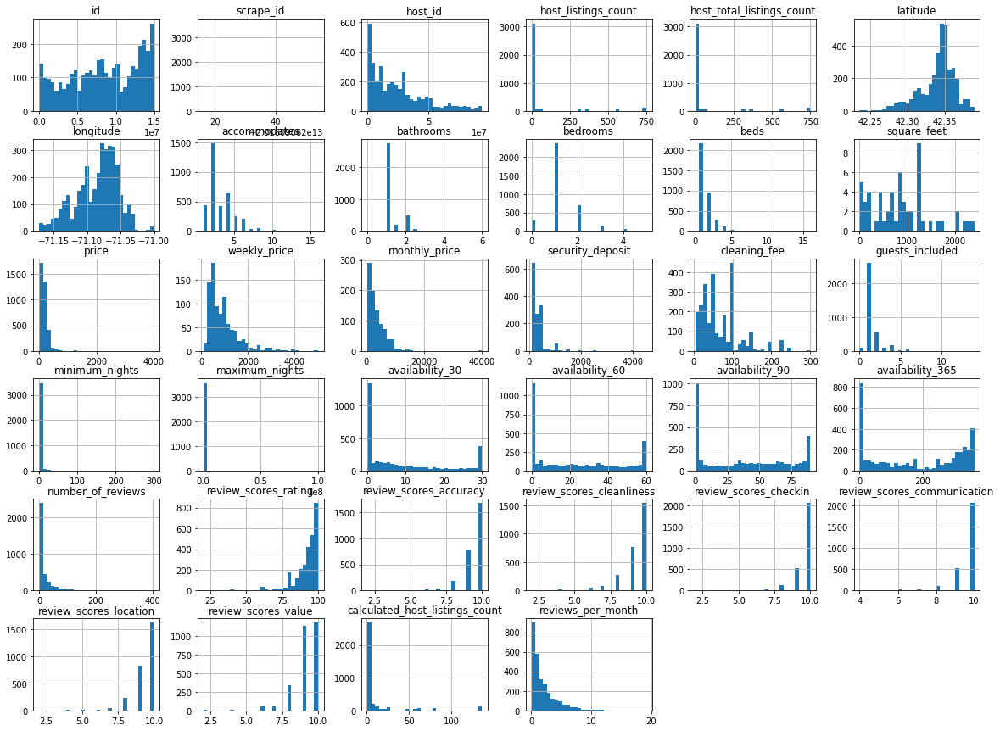

In [9]:
#Describing the dataset via histograms
listingsDf.hist(figsize=[20,15], bins=30);

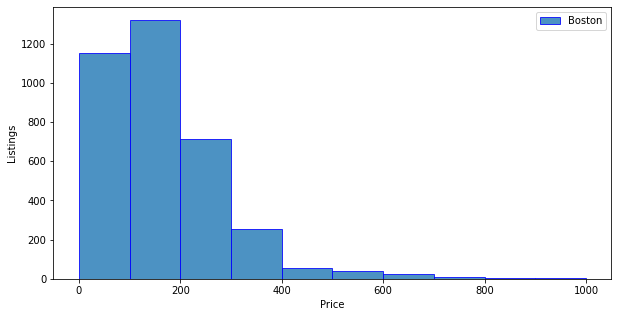

In [10]:
#Plotting all values
plt.figure(figsize=(10,5))

boston_price = listingsDf['price'].values.tolist()

plt.hist(boston_price, label='Boston', alpha=.8, edgecolor='blue', bins=10, range=(0,1000))
plt.xlabel("Price")
plt.ylabel("Listings")
plt.legend()

plt.show()

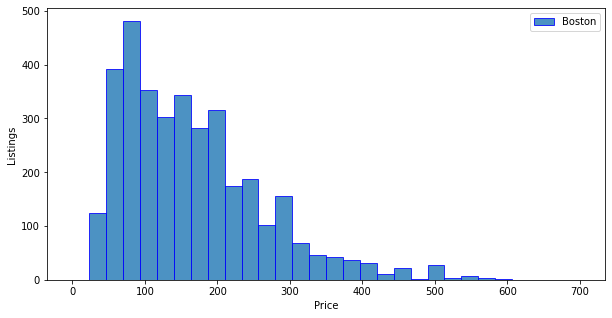

In [11]:
#Removing outliers from the dataset
plt.figure(figsize=(10,5))

listingsDf = listingsDf[listingsDf.price < 600]
listingsDf = listingsDf[listingsDf.price > 30]

price_list_edited = listingsDf['price'].values.tolist()

plt.hist(price_list_edited, label='Boston', alpha=.8, edgecolor='blue', bins=30, range=(0,700))
plt.xlabel("Price")
plt.ylabel("Listings")
plt.legend()

plt.show()

Analysing average prices per neighbourhood

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


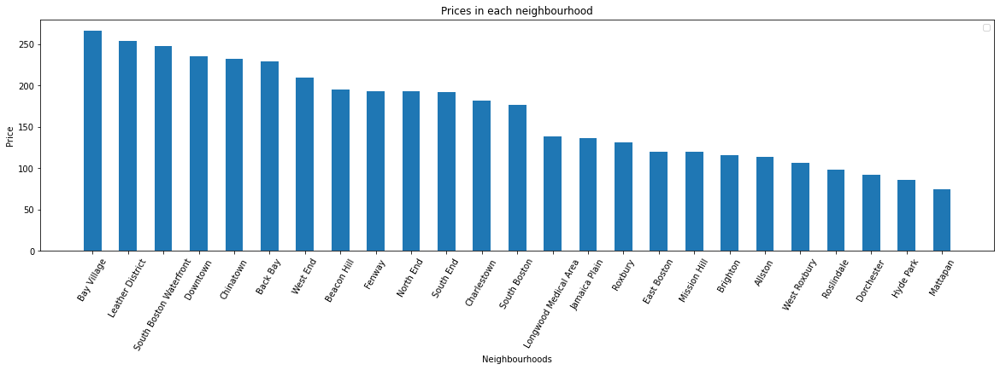

In [12]:
plt.figure(figsize=(20,5))
neighbourhood_mean = listingsDf.groupby(['neighbourhood_cleansed']).mean()['price'].sort_values(ascending=False)
X = neighbourhood_mean.keys().tolist()
X_axis = np.arange(len(X))

plt.bar(X_axis, neighbourhood_mean, 0.5)


plt.xticks(X_axis, X, rotation=60)
plt.xlabel("Neighbourhoods")
plt.ylabel("Price")
plt.title("Prices in each neighbourhood")
plt.legend()
plt.show()

# Question 1
Which factors influience the price of houses the most in Boston

Manipulate the dataset

In [13]:
#Selected adjectives to be included in the analysis
adj_lst = ['accessible', 'beautiful', 'best', 'better', 'brilliant', 'charming', 'cheap', 'cheerful', 'clean', 'comfortable', 'comfy',
            'connected', 'cosy', 'cozy', 'deluxe', 'desirable', 'elegant', 'excellent', 'favourite', 'fine', 'good', 'gorgeous', 'intimate',
            'large', 'nice', 'pretty', 'private', 'spacious', 'splendid', 'stylish', 'tidy', 'magnificent', 'delicious', 'decent', 'perfect',
            'positive', 'reasonable', 'tremendous', 'bright', 'modern', 'quiet' , 'multicultural', 'public transportation', 'easy access', 
            'shops', 'restaurants', 'welcoming', 'stores', 'shop', 'store', 'gem', 'cafes', 'transport', 'museum', 'family', 'bars', 'roommate',
            'pet', 'dog', 'cat', 'children', 'child', 'crazy', 'toddler', 'kid', 'parking', 'rail station', 'bus station', 'private bathroom',
            'kitchen', 'wifi', 'home office', 'professional', 'busy', 'chat', 'large', 'sunny']

#Selecting columns from which to extract those adjectives
desc_col_list = ["name", "summary", "space", "description", "neighborhood_overview", "notes", "transit", "interaction"]

In [14]:
def extract_key_words(df, col_list, adj_list):
    '''
    A method to extract all the key words specified in the list 'adj_list'
    by combining all the text from the colums that are specified in 'col_list'
    Then separating the text into individual strings and checking for matching
    words. Highlighting cell of respective key word as 1 if the word exists in the text
    and as 0 if it doesnt

    Args:
    df - Dataframe
    col_list - list of columns whose text to be combined
    adj_list - list of key words
    '''
    df["combinedString"] = ""
    #combining all columns together into one string
    for col in col_list:
        df["combinedString"] = df["combinedString"] + df[col].astype(str)
    
    #Checking for matches
    for adj in adj_list:
        df[adj] = 0
        for i in range(df.shape[0]):
            comb_str = df[['combinedString']].iloc[i]
            #replacing all the symbols in the string and making all the letters with lower case
            comb_str_lc = str(list(map(lambda x: x.lower(), comb_str))).replace(',', '').replace('"', '').replace('.', '').replace(':', '').replace('&', '').replace('-', '').replace('!', '').replace('(', '').replace(')', '')
            if adj in comb_str_lc:
                listingsDf[adj].iloc[i] = 1

extract_key_words(listingsDf, desc_col_list, adj_lst)


C:\Users\Petar\AppData\Local\Temp\ipykernel_29884\2447324201.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\AppData\Local\Temp\ipykernel_29884\2447324201.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\AppData\Local\Temp\ipykernel_29884\2447324201.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Peta

Create dummy variables and keep only needed columns

In [16]:
dummy_col = ['bed_type', 'room_type', 'property_type', 'host_response_time','bedrooms', "cancellation_policy", "instant_bookable", "neighbourhood_cleansed",
                "require_guest_profile_picture", "host_has_profile_pic", "host_identity_verified"]

for col in  dummy_col:
        #for each cat add dummy var, drop original column
        listingsDf = pd.concat([listingsDf.drop(col, axis=1), pd.get_dummies(listingsDf[col], prefix=col, prefix_sep='_', drop_first=True)], axis=1)

In [17]:
keep_col_list = []
keep_col_list = keep_col_list + listingsDf.select_dtypes(exclude='object').columns.tolist()

In [18]:
#Create a new dataframe only with kept columns
listings_cleaned = listingsDf[keep_col_list]

#Further remove columns which will not be included in the analysis
listings_cleaned = listings_cleaned.drop(['scrape_id', 'host_id',"host_listings_count", "host_total_listings_count", 
                                "square_feet","reviews_per_month", "minimum_nights", "maximum_nights", 
                                "number_of_reviews",
                                "calculated_host_listings_count"], axis=1)
                                							

listings_cleaned

,id,latitude,longitude,accommodates,bathrooms,beds,price,weekly_price,monthly_price,security_deposit,...,neighbourhood_cleansed_Roslindale,neighbourhood_cleansed_Roxbury,neighbourhood_cleansed_South Boston,neighbourhood_cleansed_South Boston Waterfront,neighbourhood_cleansed_South End,neighbourhood_cleansed_West End,neighbourhood_cleansed_West Roxbury,require_guest_profile_picture_t,host_has_profile_pic_t,host_identity_verified_t
0,12147973,42.282619,-71.133068,4,1.5,3.0,250.0,NaN,NaN,NaN,...,1,0,0,0,0,0,0,0,1,0
1,3075044,42.286241,-71.134374,2,1.0,1.0,65.0,400.0,NaN,95.0,...,1,0,0,0,0,0,0,0,1,1
2,6976,42.292438,-71.135765,2,1.0,1.0,65.0,395.0,1350.0,NaN,...,1,0,0,0,0,0,0,1,1,1
3,1436513,42.281106,-71.121021,4,1.0,2.0,75.0,NaN,NaN,100.0,...,1,0,0,0,0,0,0,0,1,0
4,7651065,42.284512,-71.136258,2,1.5,2.0,79.0,NaN,NaN,NaN,...,1,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3580,8373729,42.380968,-71.083795,3,1.0,1.0,69.0,NaN,NaN,95.0,...,0,0,0,0,0,0,0,0,1,1
3581,14844274,42.347503,-71.118336,2,1.0,1.0,150.0,NaN,NaN,100.0,...,0,0,0,0,0,0,0,0,1,1
3582,14585486,42.371771,-71.071300,4,1.0,1.0,198.0,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,1,0
3583,14603878,42.385226,-71.080923,2,1.0,1.0,65.0,NaN,NaN,100.0,...,0,0,0,0,0,0,0,0,1,1


Visualize the Top 30 Positive and Top 30 negative correlations with price

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


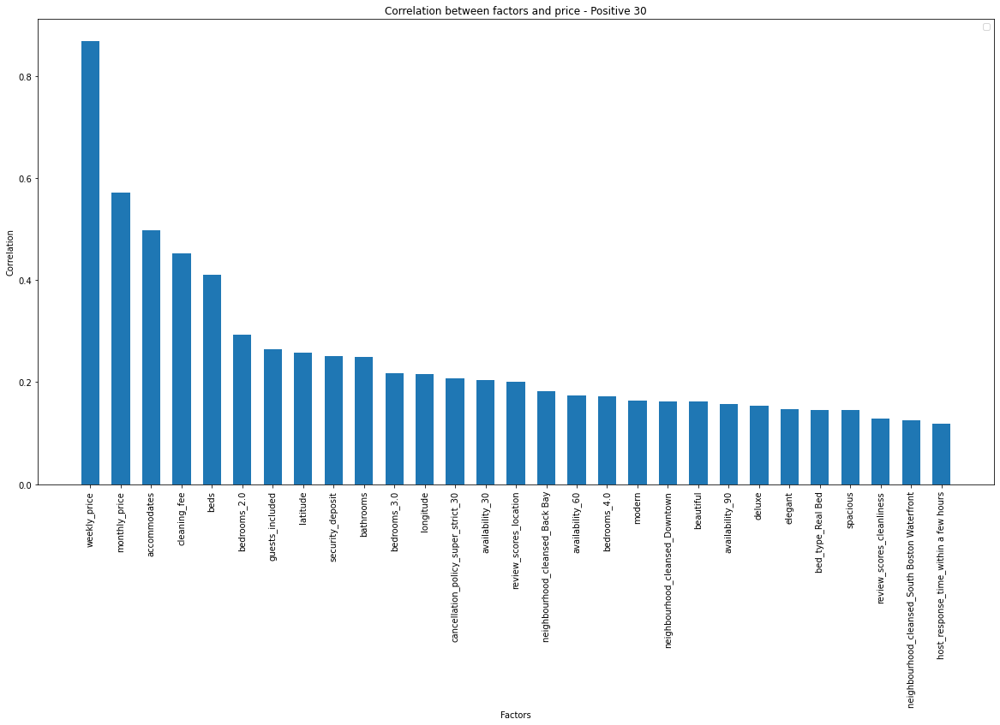

In [19]:
most_infl_s = listings_cleaned.corr()['price'].sort_values(ascending = False)[1:]

plt.figure(figsize=(20,10))

X = most_infl_s[:30].keys().tolist()
X_axis = np.arange(29)
plt.bar(X_axis, most_infl_s[1:30], 0.6)

plt.xticks(X_axis[:30], X[:29], rotation=90)
plt.xlabel("Factors")
plt.ylabel("Correlation")
plt.title("Correlation between factors and price - Positive 30")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


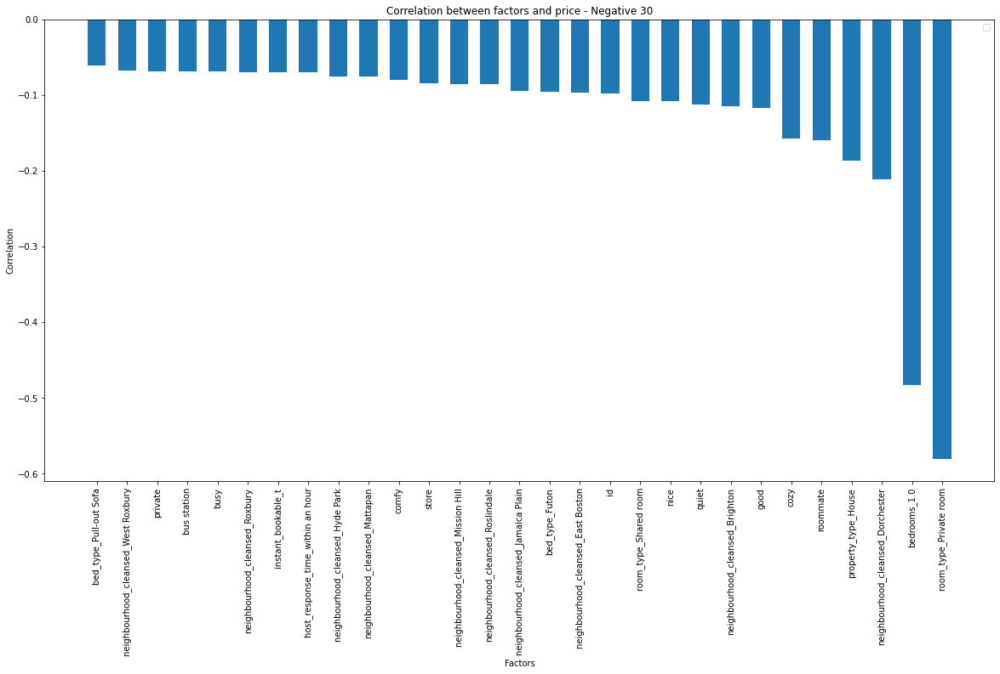

In [20]:
plt.figure(figsize=(20,10))

X = most_infl_s[-30:].keys().tolist()
X_axis = np.arange(29)
plt.bar(X_axis, most_infl_s[-29:], 0.6)

plt.xticks(X_axis, X[-29:], rotation=90)
plt.xlabel("Factors")
plt.ylabel("Correlation")
plt.title("Correlation between factors and price - Negative 30")
plt.legend()
plt.show()

# Question 2
Find if there are differences in words which might reflect the difference in price between neighbourhoods

# Question 3
Find the best and worst listed deals

Deal with NaN values

In [22]:
#List columns with NaN values
set(listings_cleaned.columns[listings_cleaned.isnull().mean() > 0])

{'bathrooms',
 'beds',
 'cleaning_fee',
 'monthly_price',
 'review_scores_accuracy',
 'review_scores_checkin',
 'review_scores_cleanliness',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_rating',
 'review_scores_value',
 'security_deposit',
 'weekly_price'}

In [23]:
bool_cols = ["cleaning_fee", "security_deposit"]

def populateNA(df,bool_cols):
    '''
    A method to populate the NaN values in a dataframe. Boolean columns will consist of 
    1 if there is a value and a 0 if there is an NaN. All other columns' NaNs' to be populated
    with the mean of its respective column

    Args:
    df - dataframe
    bool_cols - columns to be transformed to boolean values

    Return:
    df_no_na - a dataframe with no NaN values
    '''
    df[bool_cols] = df[bool_cols].where(df[bool_cols].isnull(), 1).fillna(0).astype(int)
    #All other NaN values to be populated with the column mean
    df_no_na = df
    df_no_na.fillna(df_no_na.mean(), inplace=True)

    return(df_no_na)

listings_no_nan = populateNA(listings_cleaned, bool_cols)


In [26]:
#Split into explanatory and response variables
X = listings_no_nan.drop(['price'], axis=1)
y = listings_no_nan['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_score = r2_score(y_test, y_test_preds)
train_score = r2_score(y_train, y_train_preds)

print('The test score is: ', '{:.3f}'.format(test_score))
print('The train score is: ', '{:.3f}'.format(train_score))

The test score is:  0.651
The train score is:  0.683


c:\Programs\Python\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


c:\Programs\Python\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


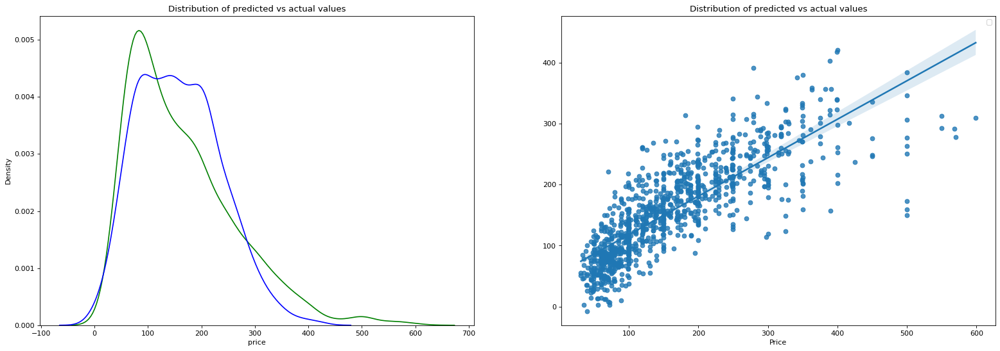

Mean absolute error of LinearRegression(normalize=True): 39.96386189106034


In [29]:
def evaluate_model(model, x_train, y_train, x_test, y_test, y_test_preds):

    '''
    A method to create visualizations on the performance of the Linear model

    Args:
    _model - LinearRegression model
    x_train - trained X
    y_train - trained Y
    x_test - test X
    y_test - test Y
    y_test_preds - predicted values for y based on the Linear model

    '''
    model.fit(x_train, y_train)
    _mean_abs_err = mean_absolute_error(y_test, y_test_preds)
    
    fig, axs = plt.subplots(1, 2, figsize=(24, 8), dpi=80)
    axs[0].set_title('Distribution of predicted vs actual values')
    ax1 = sns.kdeplot(data=y_test, color="g", label='Actual values', ax=axs[0])
    ax2 = sns.kdeplot(data=y_test_preds, color="b", label='Predicted values', ax=ax1)
    
    sns.regplot(x=y_test, y=y_test_preds)
    plt.title('Distribution of predicted vs actual values')
    plt.xlabel('Price')
    plt.legend()
    plt.show()
    plt.close()
    
    print("Mean absolute error of {0}: {1}".format(model, _mean_abs_err))

# Create instance of Linear Regressor and evaluate the same
evaluate_model(lm_model, X_train, y_train, X_test, y_test, y_test_preds)

Combine the data with the predicted values

In [35]:
X_test['pred_price'] = lm_model.predict(X_test)
X_train['pred_price'] = lm_model.predict(X_train)